In [4]:
# Importing libraries for data manipulation and analysis
import pandas as pd
import numpy as np

# Importing libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import bokeh
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from ipywidgets import interact

In [7]:
# Load the dataset
df = pd.read_csv('fifa21_raw_data.csv')  

/var/folders/vc/_nr15f05115d17d7n42nl5km0000gn/T/ipykernel_7314/3893638812.py:2: DtypeWarning: Columns (76) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('fifa21_raw_data.csv')


In [8]:
df.columns

Index(['photoUrl', 'LongName', 'playerUrl', 'Nationality', 'Positions', 'Name',
       'Age', '↓OVA', 'POT', 'Team & Contract', 'ID', 'Height', 'Weight',
       'foot', 'BOV', 'BP', 'Growth', 'Joined', 'Loan Date End', 'Value',
       'Wage', 'Release Clause', 'Attacking', 'Crossing', 'Finishing',
       'Heading Accuracy', 'Short Passing', 'Volleys', 'Skill', 'Dribbling',
       'Curve', 'FK Accuracy', 'Long Passing', 'Ball Control', 'Movement',
       'Acceleration', 'Sprint Speed', 'Agility', 'Reactions', 'Balance',
       'Power', 'Shot Power', 'Jumping', 'Stamina', 'Strength', 'Long Shots',
       'Mentality', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Defending', 'Marking', 'Standing Tackle',
       'Sliding Tackle', 'Goalkeeping', 'GK Diving', 'GK Handling',
       'GK Kicking', 'GK Positioning', 'GK Reflexes', 'Total Stats',
       'Base Stats', 'W/F', 'SM', 'A/W', 'D/W', 'IR', 'PAC', 'SHO', 'PAS',
       'DRI', 'DEF', 'PHY', 'Hits

In [9]:
# 1. Convert Height and Weight to Numerical Forms
df['Height_numeric'] = df['Height'].apply(lambda x: int(x.split("'")[0])*12 + int(x.split("'")[1].replace("\"", "")))
df['Weight_numeric'] = df['Weight'].str.extract('(\d+)').astype(float)

In [10]:
df['Height_numeric']

0        67
1        74
2        74
3        71
4        69
         ..
18974    70
18975    67
18976    70
18977    69
18978    69
Name: Height_numeric, Length: 18979, dtype: int64

In [11]:
# 2. Remove Newline Characters
df = df.replace('\n', '', regex=True)

In [18]:
# df['Joined']

In [19]:
# 3. Check Players' Duration at Clubs
df['Joined'] = pd.to_datetime(df['Joined'])
df['Years_at_Club'] = (pd.to_datetime('today') - df['Joined']).dt.days / 365

In [20]:
# df['Joined']
# df['Years_at_Club']

In [22]:
# 4. Convert String Columns to Numbers
df['Value_numeric'] = (df['Value']
                       .replace('[€,KM]+', '', regex=True)
                       .replace('M', 'e6', regex=True)
                       .replace('K', 'e3', regex=True)
                       .map(pd.eval)
                       .astype(float)
                      )

df['Wage_numeric'] = (df['Wage']
                      .replace('[€,KM]+', '', regex=True)
                      .replace('M', 'e6', regex=True)
                      .replace('K', 'e3', regex=True)
                      .map(pd.eval)
                      .astype(float)
                     )


In [24]:
# df['Value_numeric']

In [25]:
# 5. Handle 'Star' Characters
star_columns = ['PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY']  # Replace with the actual column names
df[star_columns] = df[star_columns].replace('\*', '', regex=True).astype(float)

In [26]:
# 6. Identify Underpaid Players: Scatter plot with Bokeh
output_notebook()
p = figure(title="Wage vs. Value", x_axis_label='Wage', y_axis_label='Value', tools="pan,box_zoom,reset,save")
p.scatter(x='Wage_numeric', y='Value_numeric', source=df, size=10, color='blue', alpha=0.5)
show(p)

Loading BokehJS ...

/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


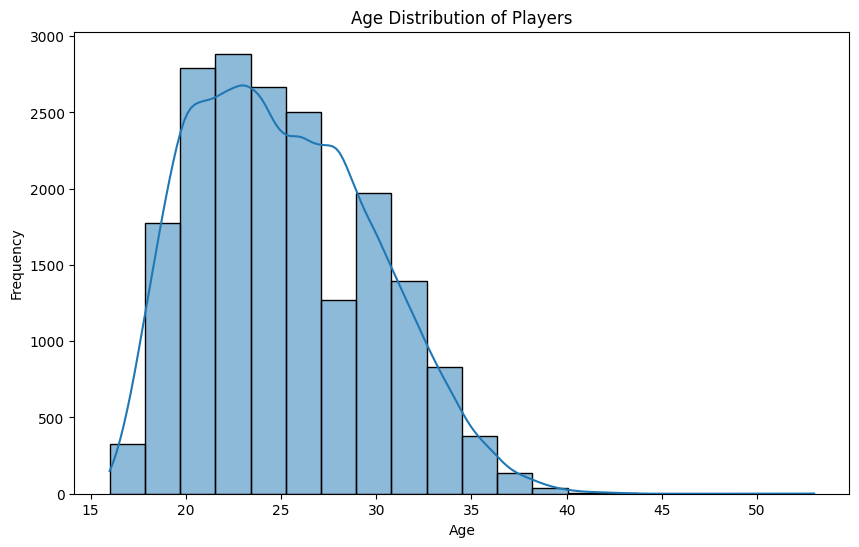

In [27]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Age'], bins=20, kde=True)
plt.title('Age Distribution of Players')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()


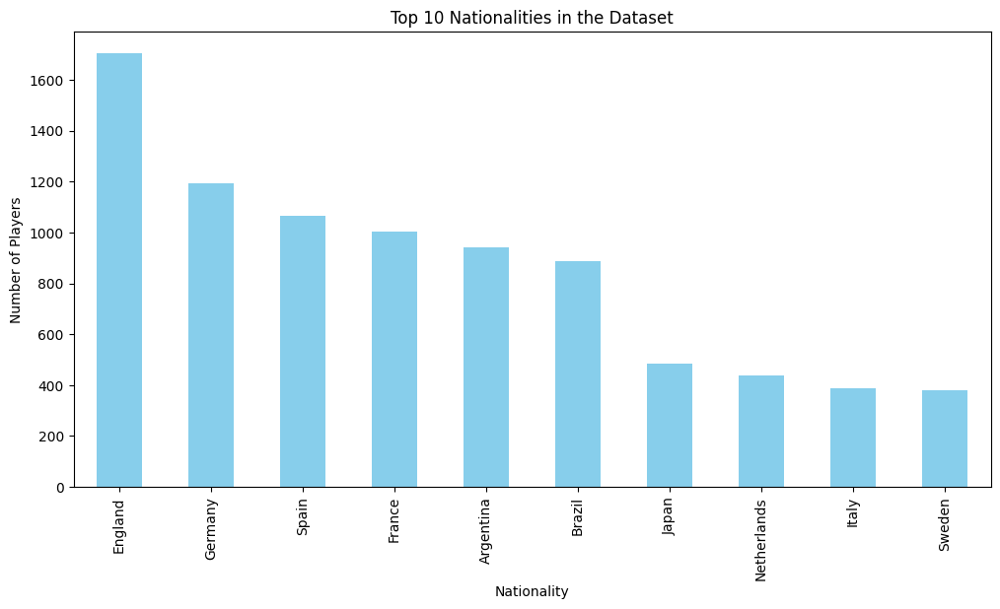

In [28]:
top_nationalities = df['Nationality'].value_counts().head(10)
plt.figure(figsize=(12, 6))
top_nationalities.plot(kind='bar', color='skyblue')
plt.title('Top 10 Nationalities in the Dataset')
plt.xlabel('Nationality')
plt.ylabel('Number of Players')
plt.show()


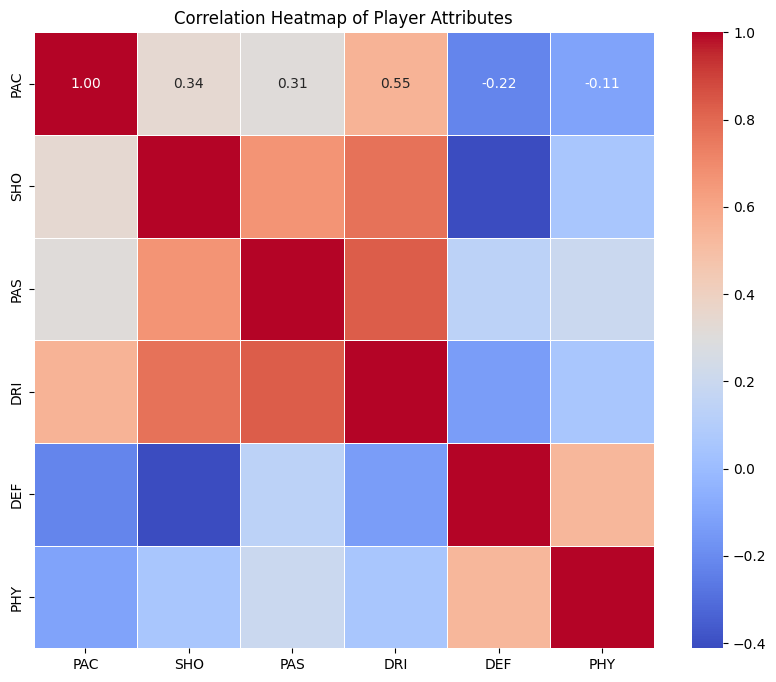

In [30]:
attributes = ['PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY']
correlation_matrix = df[attributes].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Player Attributes')
plt.show()


In [31]:
# Drop less important features
less_important_features = ['photoUrl', 'playerUrl', 'ID', 'Hits', 'IR', 'Loan Date End']

df = df.drop(less_important_features, axis=1)


/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

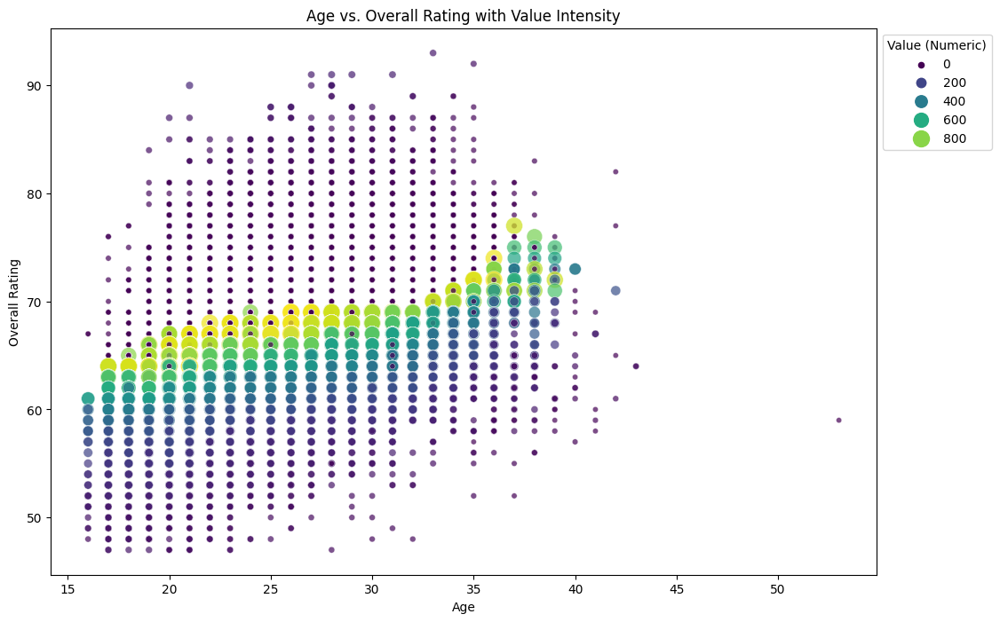

In [33]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Age', y='↓OVA', data=df, hue='Value_numeric', alpha=0.7, palette='viridis', size='Value_numeric', sizes=(20, 200))
plt.title('Age vs. Overall Rating with Value Intensity')
plt.xlabel('Age')
plt.ylabel('Overall Rating')
plt.legend(title='Value (Numeric)', loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


In [37]:
# plt.figure(figsize=(14, 8))
# sns.violinplot(x='Wage_numeric', y='Positions', data=df, order=df.groupby('Positions')['Wage_numeric'].median().sort_values(ascending=False).index, palette='viridis', cut=0)
# plt.title('Wage Distribution Across Player Positions')
# plt.xlabel('Wage (Numeric)')
# plt.ylabel('Position')
# plt.show()
